## Simulation 101 - Project 1 (3-link planar Arm)


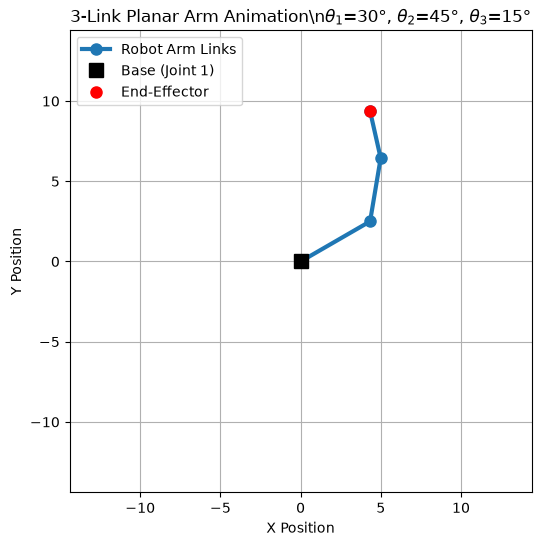

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

plt.ioff()

def simulate_3link_planar_arm(theta1, theta2, theta3, L1, L2, L3, duration=4, fps=30):
    """Create a playable animation of a 3-link planar arm in a notebook."""
    t1_base = np.radians(theta1)
    t2_base = np.radians(theta2)
    t3_base = np.radians(theta3)

    fig, ax = plt.subplots(figsize=(6, 6))

    line, = ax.plot([], [], '-o', linewidth=3, markersize=8, color='tab:blue', label='Robot Arm Links')
    base_point, = ax.plot([], [], 'ks', markersize=10, label='Base (Joint 1)')
    end_point, = ax.plot([], [], 'ro', markersize=8, label='End-Effector')

    def update(frame):
        time_sec = frame / fps
        phase = 2 * np.pi * time_sec / max(duration, 1e-6)

        t1 = t1_base + 0.25 * np.sin(phase)
        t2 = t2_base + 0.20 * np.sin(phase + 0.5)
        t3 = t3_base + 0.15 * np.sin(phase + 1.0)

        x0, y0 = 0, 0
        x1 = L1 * np.cos(t1)
        y1 = L1 * np.sin(t1)
        x2 = x1 + L2 * np.cos(t1 + t2)
        y2 = y1 + L2 * np.sin(t1 + t2)
        x3 = x2 + L3 * np.cos(t1 + t2 + t3)
        y3 = y2 + L3 * np.sin(t1 + t2 + t3)

        x_coords = [x0, x1, x2, x3]
        y_coords = [y0, y1, y2, y3]

        line.set_data(x_coords, y_coords)
        base_point.set_data([x0], [y0])
        end_point.set_data([x3], [y3])

        ax.set_title(
            f'3-Link Planar Arm Animation\\n'
            f'$\\theta_1$={theta1}°, $\\theta_2$={theta2}°, $\\theta_3$={theta3}°'
        )
        return line, base_point, end_point

    limit = (L1 + L2 + L3) * 1.2
    ax.set_xlim(-limit, limit)
    ax.set_ylim(-limit, limit)
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True)
    ax.set_xlabel('X Position')
    ax.set_ylabel('Y Position')
    ax.legend(loc='upper left')

    frames = int(duration * fps)
    animation = FuncAnimation(fig, update, frames=frames, interval=1000 / fps, blit=False, repeat=False)
    display(HTML(animation.to_jshtml()))

# Example execution
LINK_1_LENGTH = 5.0
LINK_2_LENGTH = 4.0
LINK_3_LENGTH = 3.0

JOINT_ANGLE_1 = 30  # degrees
JOINT_ANGLE_2 = 45  # degrees
JOINT_ANGLE_3 = 15  # degrees

simulate_3link_planar_arm(JOINT_ANGLE_1, JOINT_ANGLE_2, JOINT_ANGLE_3, LINK_1_LENGTH, LINK_2_LENGTH, LINK_3_LENGTH)

## Simulation 101 - Project 2 (Inverse Kinematics using Numerical Method)
### Algorithm to solve IK through Numerical Method for a 2-link planar Arm

1. Define L1 and L2
2. Choose initial joint angles q = [θ1, θ2]
3. Define desired target [xd, yd]

4. Calculate current end-effector position using FK

5. Calculate position error:
      error = target - current_position

6. Calculate the Jacobian J

7. Calculate joint correction:
      Δq = pinv(J) @ error

8. Update:
      q = q + α Δq

9. Repeat until error is sufficiently small

10. Plot the links and target


                TARGET
             (xd, yd)
                  │
                  ▼
        ┌──────────────────┐
        │ Calculate Error  │
        │ e = xd - x       │
        └────────┬─────────┘
                 │
                 ▼
        ┌──────────────────┐
        │    Jacobian J    │
        │ ∂(x,y) / ∂(θ)    │
        └────────┬─────────┘
                 │
                 ▼
        ┌──────────────────┐
        │  Pseudoinverse    │
        │      J†           │
        └────────┬─────────┘
                 │
                 ▼
        ┌──────────────────┐
        │ Δq = J† e        │
        └────────┬─────────┘
                 │
                 ▼
        ┌──────────────────┐
        │ q = q + αΔq      │
        └────────┬─────────┘
                 │
                 ▼
        ┌──────────────────┐
        │ Forward Kinematics│
        │    x = f(q)       │
        └────────┬─────────┘
                 │
                 ▼
             New Error
                 │
                 └───────────────┐
                                 │
                                 ▼
                            Repeat until
                              error < ε

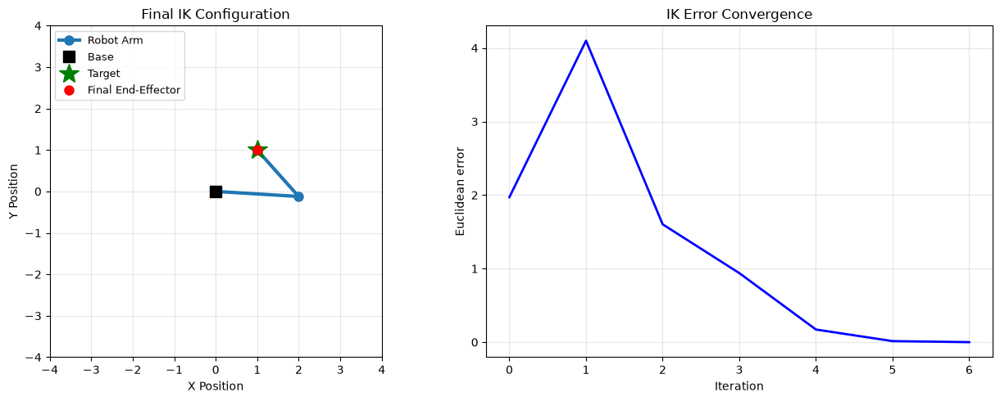


✓ IK Solution Complete
  - Final angles: θ₁=-3.48°, θ₂=135.10°
  - Target: (1.00, 1.00)
  - Final position: (0.9999, 1.0000)
  - Final error: 0.000065
  - Iterations: 7


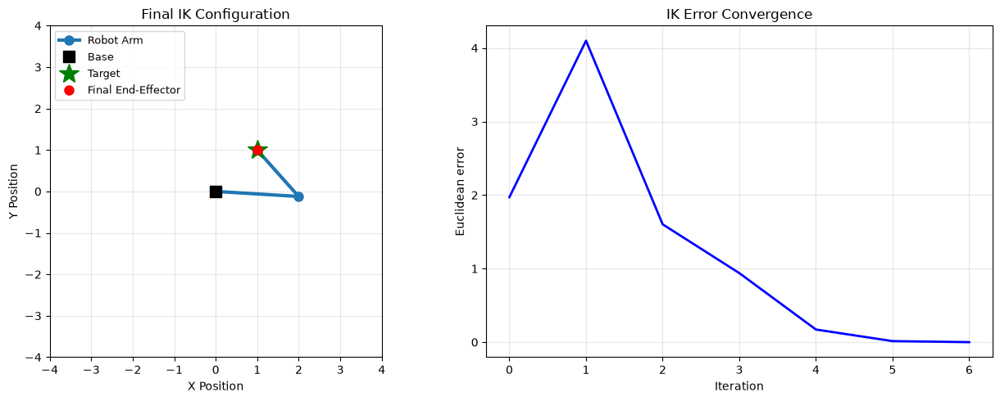

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

plt.ioff()

# 2-Link Planar Arm Inverse Kinematics with Animation

def simulate_2link_planar_arm_ik(L1, L2, target_x, target_y, fps=30, duration=4):
    """Animate a 2-link planar arm solving inverse kinematics."""
    
    # Initialize joint angles
    q = np.array([np.deg2rad(30), np.deg2rad(30)])
    target = np.array([target_x, target_y])
    
    # IK parameters
    alpha = 1
    tolerance = 1e-3
    max_iterations = 1000
    
    # Store history for animation
    q_history = [q.copy()]
    error_history = []
    
    # Solve IK
    for i in range(max_iterations):
        # Forward kinematics
        theta1, theta2 = q
        x1 = L1 * np.cos(theta1)
        y1 = L1 * np.sin(theta1)
        x2 = x1 + L2 * np.cos(theta1 + theta2)
        y2 = y1 + L2 * np.sin(theta1 + theta2)
        
        current_position = np.array([x2, y2])
        error = target - current_position
        error_norm = np.linalg.norm(error)
        error_history.append(error_norm)
        
        if error_norm < tolerance:
            break
        
        # Jacobian
        J = np.array([
            [-L1 * np.sin(theta1) - L2 * np.sin(theta1 + theta2),
             -L2 * np.sin(theta1 + theta2)],
            [L1 * np.cos(theta1) + L2 * np.cos(theta1 + theta2),
             L2 * np.cos(theta1 + theta2)]
        ])
        
        # Pseudoinverse and update
        J_pinv = np.linalg.pinv(J)
        delta_q = J_pinv @ error
        q = q + alpha * delta_q
        q_history.append(q.copy())


    # Final configuration for static plot
    theta1_final, theta2_final = q
    x1_final = L1 * np.cos(theta1_final)
    y1_final = L1 * np.sin(theta1_final)
    x2_final = x1_final + L2 * np.cos(theta1_final + theta2_final)
    y2_final = y1_final + L2 * np.sin(theta1_final + theta2_final)

    # Static notebook-friendly plot
    static_fig, (ax_static_arm, ax_static_err) = plt.subplots(1, 2, figsize=(13, 5))
    
    reach = L1 + L2
    ax_static_arm.plot([0, x1_final, x2_final], [0, y1_final, y2_final], '-o', linewidth=3, markersize=8, color='tab:blue', label='Robot Arm')
    ax_static_arm.plot([0], [0], 'ks', markersize=10, label='Base')
    ax_static_arm.plot([target[0]], [target[1]], 'g*', markersize=18, label='Target')
    ax_static_arm.plot([x2_final], [y2_final], 'ro', markersize=8, label='Final End-Effector')
    
    ax_static_arm.set_xlim(-reach - 0.5, reach + 0.5)
    ax_static_arm.set_ylim(-reach - 0.5, reach + 0.5)
    ax_static_arm.set_aspect('equal', adjustable='box')
    ax_static_arm.grid(True, alpha=0.3)
    ax_static_arm.set_xlabel('X Position')
    ax_static_arm.set_ylabel('Y Position')
    ax_static_arm.set_title('Final IK Configuration')
    ax_static_arm.legend(loc='upper left', fontsize=9)

    if error_history:
        ax_static_err.plot(range(len(error_history)), error_history, 'b-', linewidth=2)
        ax_static_err.set_title('IK Error Convergence')
        ax_static_err.set_xlabel('Iteration')
        ax_static_err.set_ylabel('Euclidean error')
        ax_static_err.grid(True, alpha=0.3)
    else:
        ax_static_err.text(0.5, 0.5, 'No error data', ha='center', va='center')
        ax_static_err.set_axis_off()
    
    static_fig.tight_layout()
    display(static_fig)
    
    # Prepare animation
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    
    # Left plot: arm configuration
    line, = ax1.plot([], [], '-o', linewidth=3, markersize=8, color='tab:blue', label='Robot Arm')
    base_point, = ax1.plot([], [], 'ks', markersize=10, label='Base (Joint 1)')
    end_point, = ax1.plot([], [], 'ro', markersize=8, label='End-Effector')
    target_point, = ax1.plot([], [], 'g*', markersize=20, label='Target')
    
    # Right plot: error convergence
    error_line, = ax2.plot([], [], 'b-', linewidth=2)
    
    def update(frame):
        # Interpolate between iterations for smooth animation
        total_frames = int(duration * fps)
        iteration_idx = min(int(frame * len(q_history) / total_frames), len(q_history) - 1)
        q_current = q_history[iteration_idx]
        
        # Forward kinematics
        theta1, theta2 = q_current
        x0, y0 = 0, 0
        x1 = L1 * np.cos(theta1)
        y1 = L1 * np.sin(theta1)
        x2 = x1 + L2 * np.cos(theta1 + theta2)
        y2 = y1 + L2 * np.sin(theta1 + theta2)
        
        # Update left plot
        x_coords = [x0, x1, x2]
        y_coords = [y0, y1, y2]
        
        line.set_data(x_coords, y_coords)
        base_point.set_data([x0], [y0])
        end_point.set_data([x2], [y2])
        target_point.set_data([target[0]], [target[1]])
        
        ax1.set_title(
            f'2-Link Planar Arm - Inverse Kinematics\n'
            f'$\\theta_1$={np.rad2deg(theta1):.1f}°, '
            f'$\\theta_2$={np.rad2deg(theta2):.1f}°',
            fontsize=11
        )
        
        # Update right plot (error convergence)
        current_iterations = min(iteration_idx + 1, len(error_history))
        error_line.set_data(range(current_iterations), error_history[:current_iterations])
        
        ax2.set_title('Convergence Error', fontsize=11)
        ax2.set_xlabel('Iteration')
        ax2.set_ylabel('Error (Euclidean distance)')
        
        return line, base_point, end_point, target_point, error_line
    
    # Configure left plot (arm visualization)
    reach = L1 + L2
    ax1.set_xlim(-reach - 0.5, reach + 0.5)
    ax1.set_ylim(-reach - 0.5, reach + 0.5)
    ax1.set_aspect('equal', adjustable='box')
    ax1.grid(True, alpha=0.3)
    ax1.set_xlabel('X Position')
    ax1.set_ylabel('Y Position')
    ax1.legend(loc='upper left', fontsize=9)
    
    # Configure right plot (error plot)
    if error_history:
        ax2.set_xlim(0, len(error_history))
        ax2.set_ylim(0, max(error_history) * 1.1)
    ax2.grid(True, alpha=0.3)
    
    frames = int(duration * fps)
    animation = FuncAnimation(fig, update, frames=frames, interval=1000 / fps, blit=False, repeat=True)
    
    plt.tight_layout()
    display(HTML(animation.to_jshtml()))
    plt.close()
    
    print(f"\n✓ IK Solution Complete")
    print(f"  - Final angles: θ₁={np.rad2deg(q[0]):.2f}°, θ₂={np.rad2deg(q[1]):.2f}°")
    print(f"  - Target: ({target[0]:.2f}, {target[1]:.2f})")
    print(f"  - Final position: ({x2:.4f}, {y2:.4f})")
    print(f"  - Final error: {error_history[-1]:.6f}")
    print(f"  - Iterations: {len(error_history)}")


# ========================================
# Example: Solve 2-Link Planar Arm IK
# ========================================

LINK_1_LENGTH = 2.0
LINK_2_LENGTH = 1.5

TARGET_X = 1.0
TARGET_Y = 1.0

simulate_2link_planar_arm_ik(
    LINK_1_LENGTH, 
    LINK_2_LENGTH, 
    TARGET_X, 
    TARGET_Y,
    fps=30,
    duration=4
)